<a href="https://colab.research.google.com/github/farkoo/Cat-Dog-Classifier/blob/master/CI_HW3_CatDogClassifier_Part_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Prepare train and test data (Data Preprocessing)

In [2]:
%cd drive/MyDrive

/content/drive/MyDrive


In [ ]:
%%bash
git clone "https://github.com/MKasaei00/IUT-CI-HW3-cat-dog-classifier.git"

Cloning into 'IUT-CI-HW3-cat-dog-classifier'...
Checking out files: 100% (13/13), done.


In [3]:
%cd IUT-CI-HW3-cat-dog-classifier

/content/drive/MyDrive/IUT-CI-HW3-cat-dog-classifier


In [ ]:
%%bash
7z x dataset/test_set.zip -odataset
7z x dataset/training_set.zip -odataset


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
1 file, 3711630 bytes (3625 KiB)

Extracting archive: dataset/test_set.zip
--
Path = dataset/test_set.zip
Type = zip
Physical Size = 3711630
Embedded Stub Size = 4
Total Physical Size = 45654670
Multivolume = +
Volume Index = 2
Volumes = 3

Everything is Ok

Folders: 3
Files: 2000
Size:       45739128
Compressed: 45654670

7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
1 file, 13986903 bytes (14 MiB)

Extracting archive: dataset/training_set.zip
--
Path = dataset/training_set.zip
Type = zip
Physical Size = 13986903
Embedded Stub Size = 4
Total Physical Size = 181759063
Multivolum

In [4]:
import numpy as np
import os
import cv2
from google.colab.patches import cv2_imshow
from keras.utils import np_utils
import matplotlib.pyplot as plt
import tensorflow as tf
import random
import math

In [5]:
test_dir = 'dataset/test_set'
training_dir = 'dataset/training_set'

In [22]:
def load_data_from_directory(dir,width,height,classes):
  img_data = []
  img_label = []
  categories = os.listdir(dir)
  for category in categories:
    for file in os.listdir(os.path.join(dir,category)):
      img_path = os.path.join(dir,category,file)
      img = cv2.imread(img_path)
      img = cv2.resize(img,(width,height))
      img = np.array(img).astype('float32') / 255
      
      img_data.append(img)
      img_label.append(category)

  img_onehot = np_utils.to_categorical([categories.index(label) for label in img_label],classes,dtype=np.ubyte)
  img_data = np.array(img_data)
  img_onehot = np.array(img_onehot)

  zip_list = list(zip(img_data, img_label, img_onehot))
  random.shuffle(zip_list)
  img_data, img_label, img_onehot = zip(*zip_list)
  return img_data , img_label, img_onehot

In [23]:
classes = 2
w = 128
h = 128

In [25]:
train_x , train_label, train_onehot = load_data_from_directory(training_dir,w,h,classes)
test_x , test_label, test_onehot = load_data_from_directory(test_dir,w,h,classes)

In [26]:
test_label2 = []
for i, label in enumerate(test_label):
     test_label2.append(1) if (label == 'dogs') else test_label2.append(0)

In [27]:
train_x = np.asarray(train_x)
train_label = np.asarray(train_label)
train_onehot = np.asarray(train_onehot)

test_x = np.asarray(test_x)
test_label = np.asarray(test_label2)
test_onehot = np.asarray(test_onehot)

In [28]:
!rm -rf cleanData
!mkdir cleanData
np.save('cleanData/train_x.npy',train_x)
np.save('cleanData/train_label.npy',train_label)
np.save('cleanData/train_onehot.npy',train_onehot)

np.save('cleanData/test_x.npy',test_x)
np.save('cleanData/test_label.npy',test_label)
np.save('cleanData/test_onehot.npy',test_onehot)

In [29]:
train_label = np.load('cleanData/train_onehot.npy')
train_x = np.load('cleanData/train_x.npy')

test_x = np.load('cleanData/test_x.npy')
test_label = np.load('cleanData/test_onehot.npy')
test_vec = np.load('cleanData/test_label.npy')

In [30]:
from sklearn.model_selection import train_test_split
train_X, valid_X, train_Label, valid_Label = train_test_split(train_x, train_label, test_size = 0.2, random_state = 13)

# Generate basic Neural Network

In [31]:
from keras.models import Sequential
from keras.layers import Dense,Dropout,Activation,Flatten,LeakyReLU
from keras.optimizers import Adam
from keras.losses import categorical_crossentropy
from keras.initializers import RandomNormal

# توضیح کلی در مورد عملکرد این تابع

<div dir='rtl'>

در این تابع متغیر 
config
که در واقع تمام تنظیمات لازم برای ساخت شکبه‌ی عصبی ، داده‌های آموزشی ، منظم‌سازی و هم‌چنین آگمنتیشن داده‌ها است را دریافت می‌کند.

مدل براساس مجموعه‌ی لایه‌های شبکه‌ی عصبی مطرح شده در ورودی ساخته می‌شود هر مجموعه‌ لایه می‌توانند توابع فعال‌سازی متناسب با کاربرد و متفاوتی داشته باشند و هم‌چنین ضرایب متفاوتی برای 
dropout
در نظرگرفت

تعداد 
epoch
های آموزش مدل براساس پارامتر مشخص شده و پس از اموزش مدل نمودار صحت مدل روی داده‌های آموزش و تست رسم می‌شود.

 برای اجرای های بعدی می‌تواینم از همین تابع کلی استفاده کنیم و در مواقع نیاز به پارامترها مقادیر غیرصفر بدهیم.

 در نهایت داده‌های تست را به مدل نهایی می‌دهیم و مدل را با روش های مختلف مانند 
 accuracy , recall , F1-measure
 ارزیابی کرده و گزارش را چاپ می‌کنیم.

لازم به ذکر است که منظور از کلاس 0 کلاس مربوط به تصاویر
Cats 
است و کلاس 1 کلاس مربوط به تصاویر 
‌Dogs
 می باشد.

</div>

In [32]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def train_model(config):
  model = Sequential()

  model.add(Flatten(input_shape=(h,w,3)))
  model.add(Dropout(config['in_drop_out']))

  for act ,drop_out, layers in config['layers']:
    for layer in layers:
      model.add(Dense(layer))
      model.add(act())
      model.add(Dropout(drop_out))

  model.compile(
    optimizer=Adam(config['learning_rate']),
    loss=categorical_crossentropy,
    metrics=['accuracy']
  )

  train_datagen = ImageDataGenerator(
        rotation_range=config['aug_rotation'],
        width_shift_range=config['aug_shift_w'],
        height_shift_range=config['aug_shift_h'],
        shear_range=config['aug_shear'],
        zoom_range=config['aug_zoom'],
        horizontal_flip=config['aug_horizontal_flip'],
        fill_mode='nearest'
  )

  train_generator = train_datagen.flow(train_X, train_Label, batch_size = config['batch'])

  validation_datagen = ImageDataGenerator()
  validation_generator = validation_datagen.flow(valid_X,valid_Label,batch_size=256)

  history = model.fit(train_generator,
                      validation_data=validation_generator,
                      epochs = config['epochs'],
                      batch_size=config['batch'],
                      steps_per_epoch=math.ceil(8000/config['batch']),
                      validation_steps = math.ceil(2000/config['batch'])
                    )
  
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train','validation'],loc='lower right')
  plt.show()

  test_eval = model.evaluate(test_x, test_label, verbose = 0)
  print('Test loss: ', test_eval[0])
  print('Test accuracy: ', test_eval[1])
  print('\n\n')
  
  predictes_classes = model.predict(test_x)
  predicted_classes = np.argmax(np.round(predictes_classes), axis = 1)

  from sklearn.metrics import classification_report
  target_names = ["Class {}".format(i) for i in range(classes)]
  print(classification_report(test_vec, predicted_classes, target_names = target_names))

  return model

Epoch 1/100
32/32 [==============================] - 32s 835ms/step - loss: 0.6964 - accuracy: 0.5072 - val_loss: 0.6931 - val_accuracy: 0.4935
Epoch 2/100
32/32 [==============================] - 23s 749ms/step - loss: 0.6933 - accuracy: 0.5011 - val_loss: 0.6932 - val_accuracy: 0.4876
Epoch 3/100
32/32 [==============================] - 24s 749ms/step - loss: 0.6931 - accuracy: 0.5031 - val_loss: 0.6926 - val_accuracy: 0.5463
Epoch 4/100
32/32 [==============================] - 23s 745ms/step - loss: 0.6925 - accuracy: 0.5341 - val_loss: 0.6927 - val_accuracy: 0.5054
Epoch 5/100
32/32 [==============================] - 23s 745ms/step - loss: 0.6917 - accuracy: 0.5341 - val_loss: 0.6935 - val_accuracy: 0.4957
Epoch 6/100
32/32 [==============================] - 23s 745ms/step - loss: 0.6917 - accuracy: 0.5049 - val_loss: 0.6924 - val_accuracy: 0.5145
Epoch 7/100
32/32 [==============================] - 24s 772ms/step - loss: 0.6922 - accuracy: 0.5220 - val_loss: 0.6875 - val_accuracy:

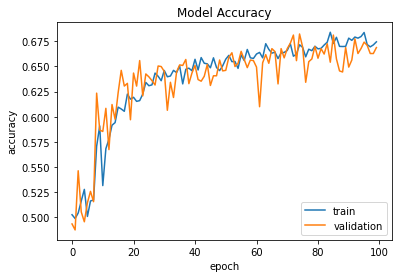

Test loss:  0.6297047734260559
Test accuracy:  0.656000018119812



              precision    recall  f1-score   support

     Class 0       0.64      0.70      0.67      1000
     Class 1       0.67      0.62      0.64      1000

    accuracy                           0.66      2000
   macro avg       0.66      0.66      0.66      2000
weighted avg       0.66      0.66      0.66      2000



In [33]:
# %%script false
model = train_model({
    'in_drop_out':0,
    'layers' : [
          (lambda : Activation('relu'),0.03,[2000,1600,800,600,500]+[400]*3+[400]*5+[300,250,200,150,120]), 
          (lambda : Activation('softmax'),0,[2])
    ],
    'learning_rate':3e-4,
    'batch':256,
    'epochs':100,
    'aug_rotation':10,
    'aug_shift_w':0.04,
    'aug_shift_h':0.04,
    'aug_shear':0.04,
    'aug_zoom':0.04,
    'aug_horizontal_flip':True
})

In [ ]:
from google.colab import drive
drive.mount('/drive')

Mounted at /drive


In [ ]:
%%script false
model.save('/drive/MyDrive/NN_Model.h5')

In [ ]:
from keras.models import load_model
model = load_model('NN_Model.h5')

In [ ]:
incorrects = np.nonzero(np.argmax(np.round(model.predict(test_x)), axis = 1) != test_vec)[0]

In [ ]:
test_x[incorrects[0]]

In [ ]:
import matplotlib.pyplot as plt

Dog


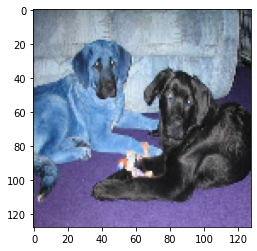





Dog


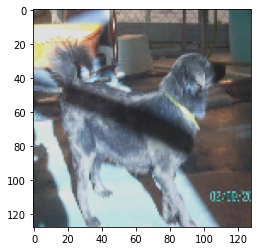





Dog


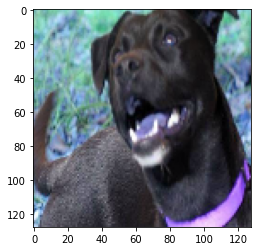





Cat


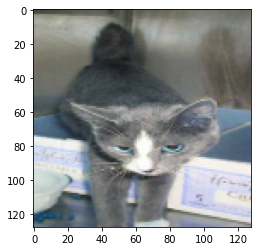





Dog


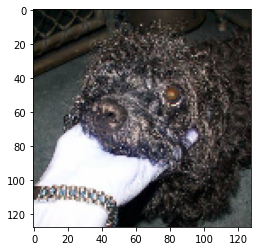





Cat


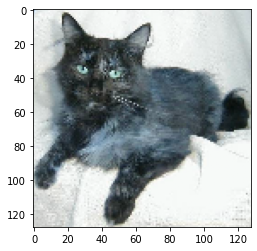





Dog


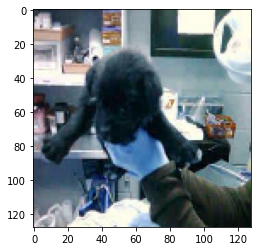





Dog


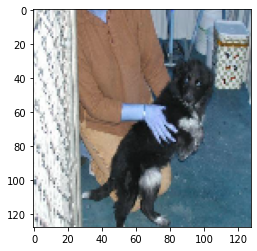





Dog


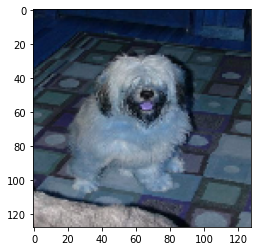





Dog


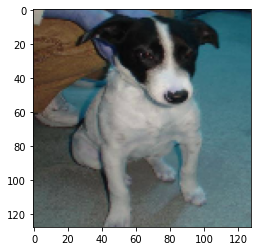





Dog


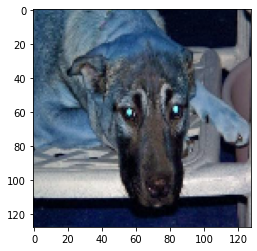





Cat


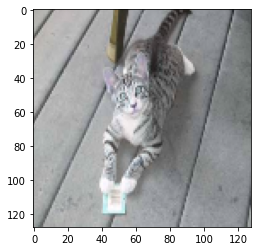





Dog


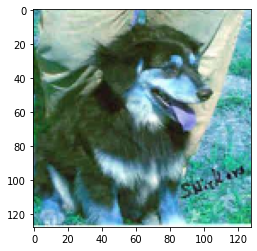





Dog


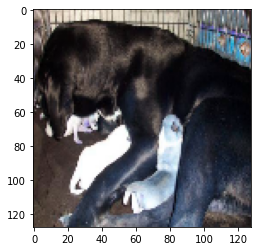





Dog


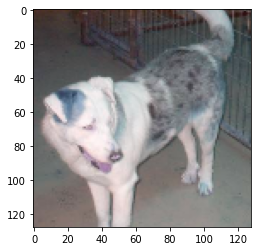





Cat


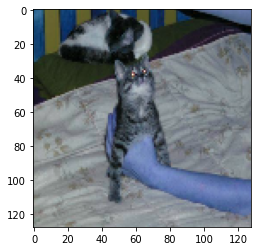





Dog


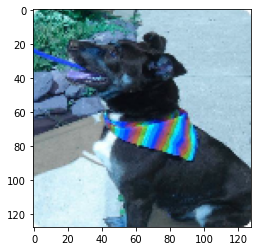





Dog


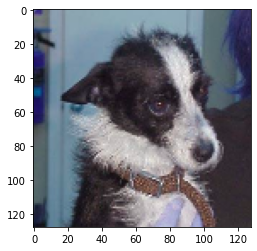





Cat


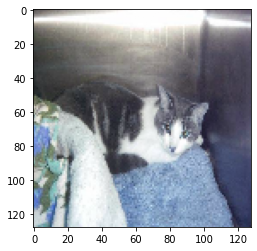





Dog


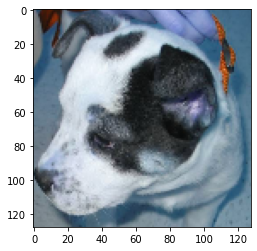





Dog


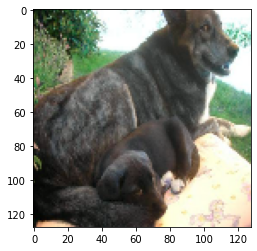





Cat


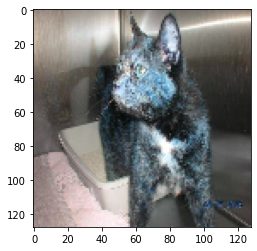





Cat


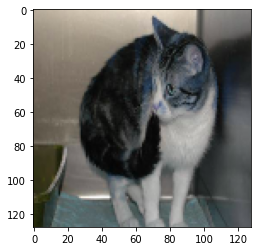





Cat


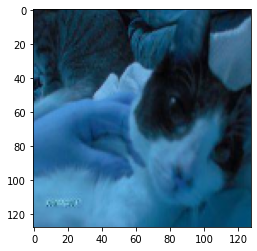





Cat


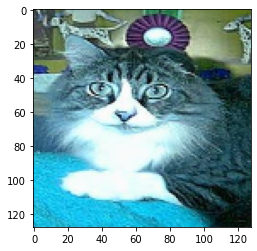





Dog


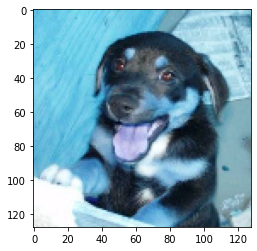





Cat


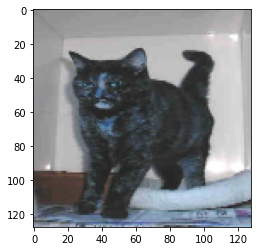





Dog


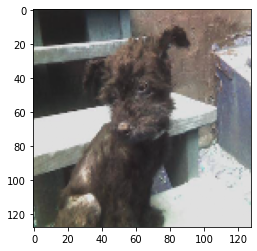





Cat


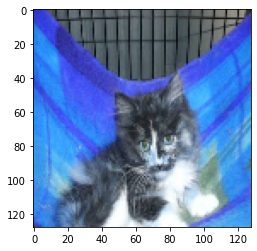





Dog


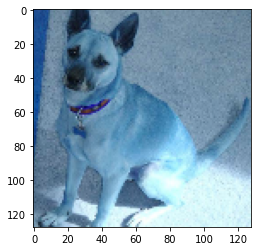





Dog


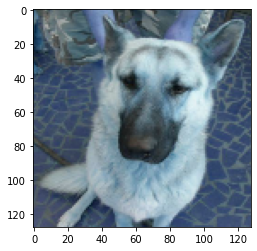





Dog


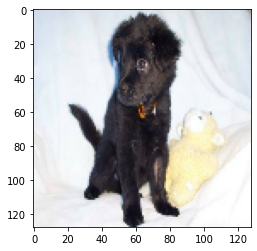





Cat


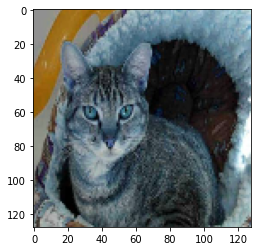





Cat


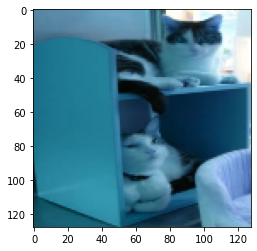





Dog


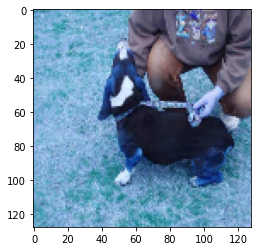





Cat


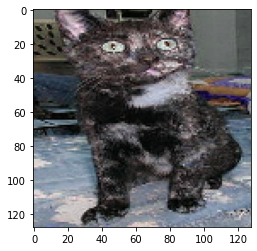





Dog


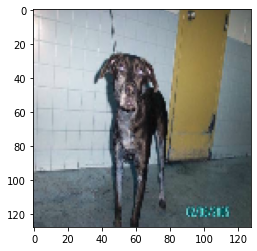





Dog


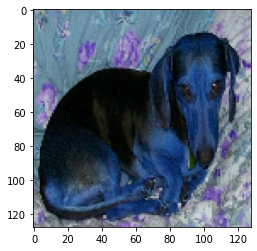





Cat


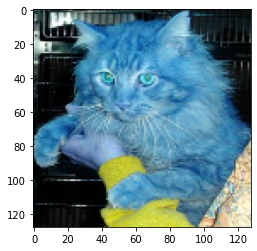





Dog


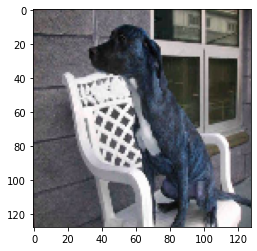





Cat


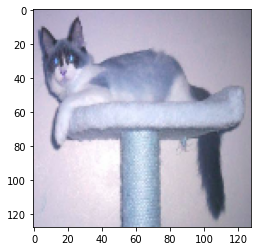





Dog


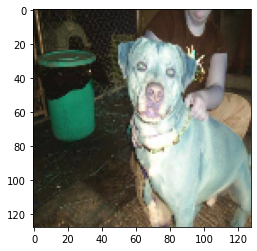





Cat


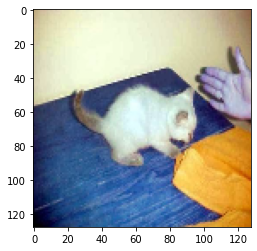





Dog


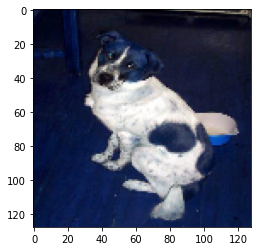





Cat


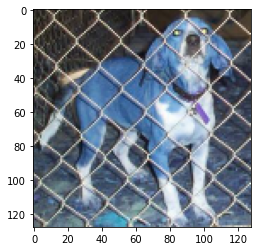





Cat


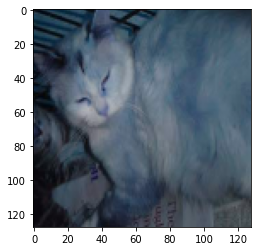





Cat


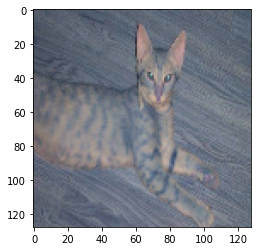





Dog


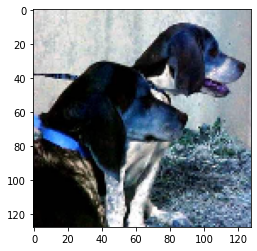





Dog


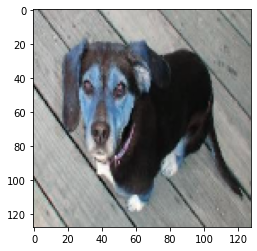





Dog


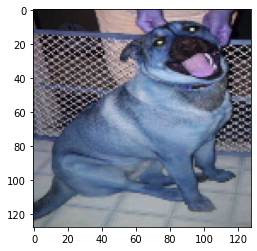





Dog


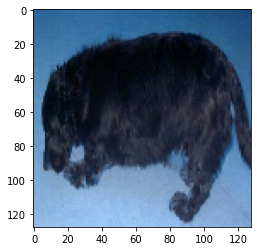





Dog


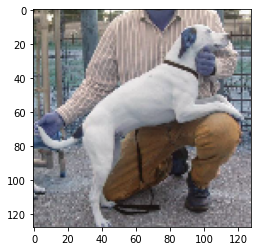





Cat


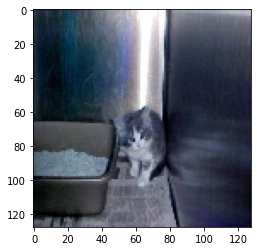





Dog


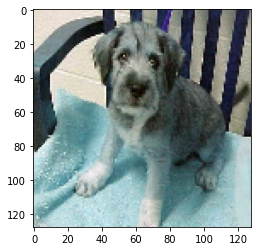





Dog


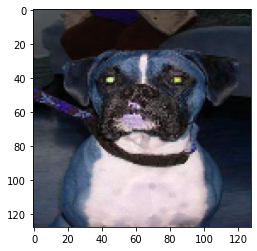





Cat


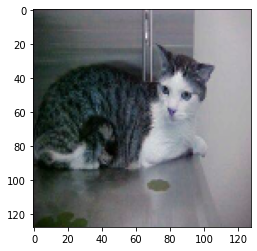





Cat


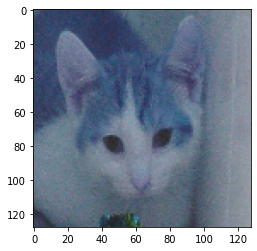





Dog


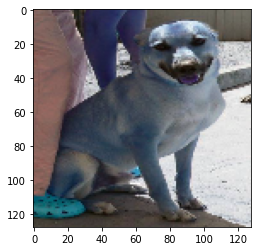





Cat


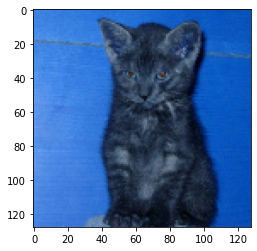





Cat


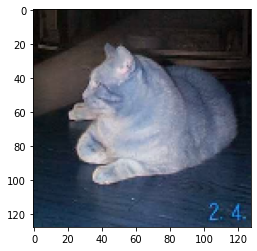





Dog


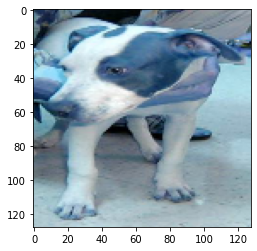





Cat


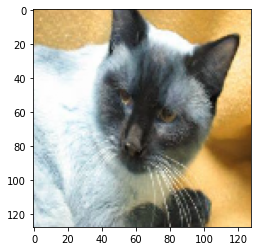





Cat


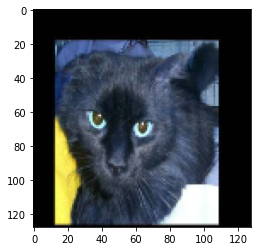





Dog


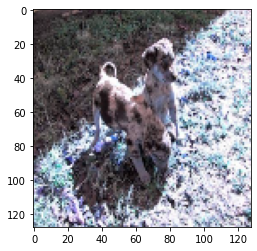





Cat


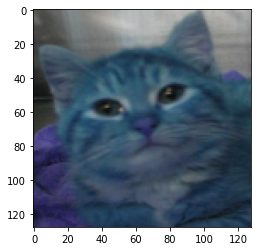





Cat


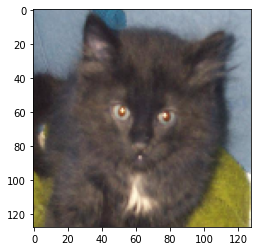





Cat


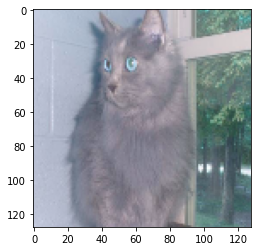





Cat


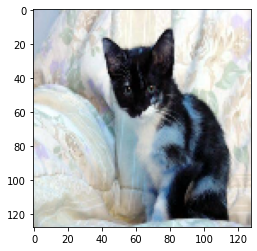





Cat


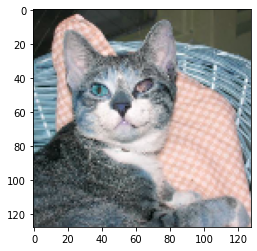





Cat


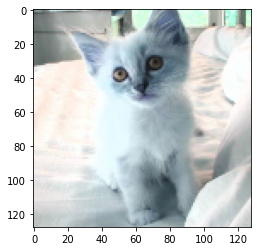





Dog


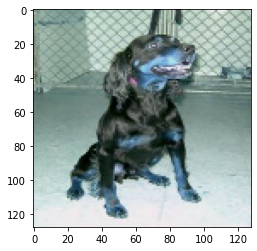





Cat


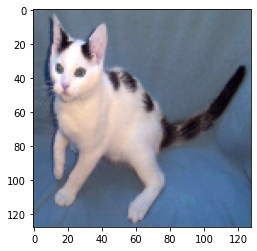





Cat


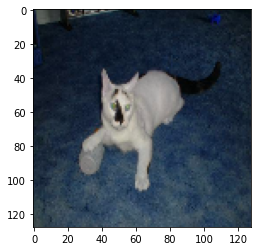





Dog


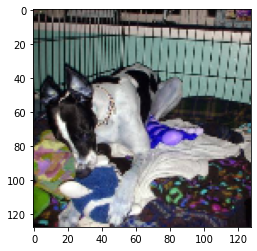





Dog


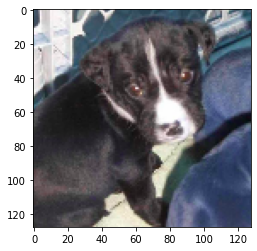





Dog


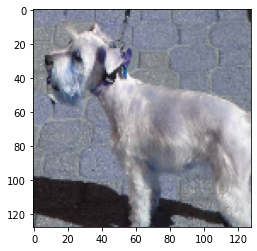





Cat


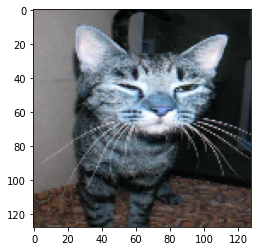





Cat


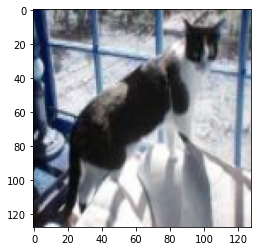





Dog


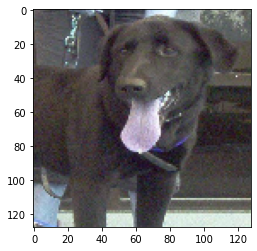





Dog


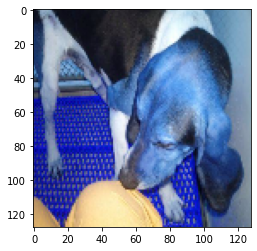





Cat


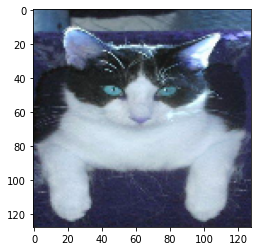





Cat


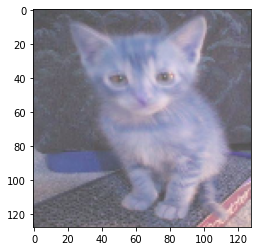





Dog


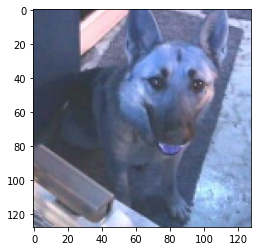





Dog


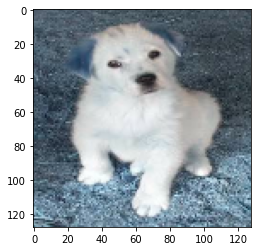





Dog


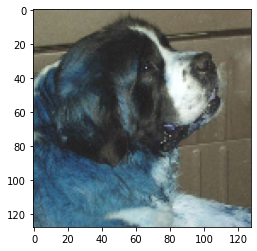





Dog


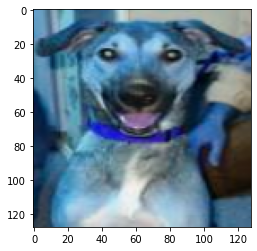





Dog


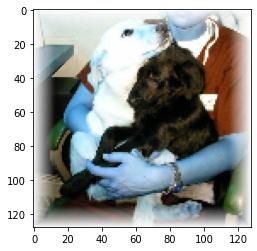





Cat


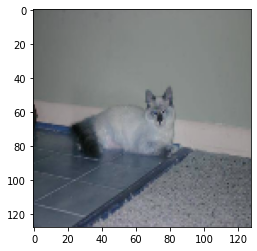





Dog


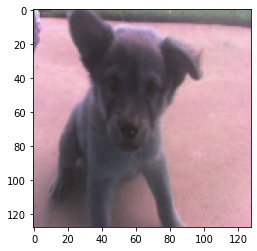





Cat


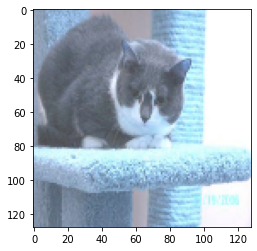





Dog


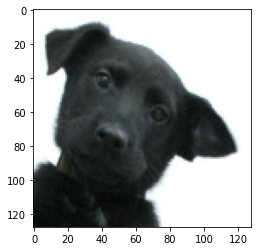





Dog


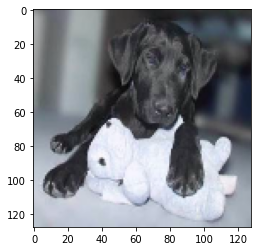





Dog


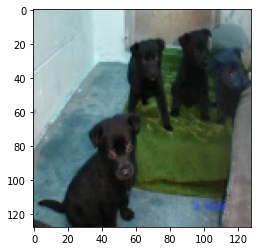





Dog


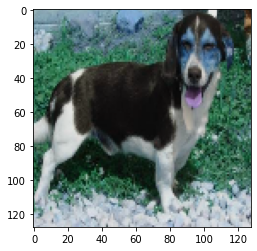





Cat


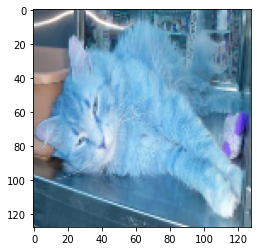





Dog


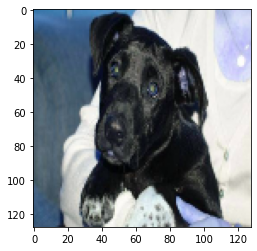





Dog


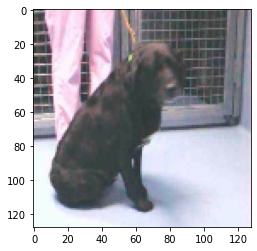





Cat


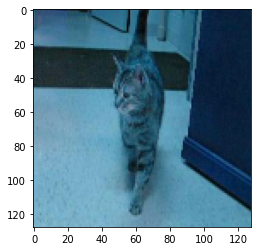





Dog


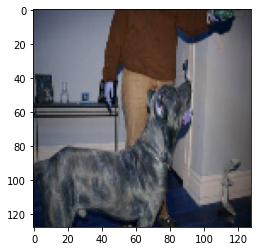





Cat


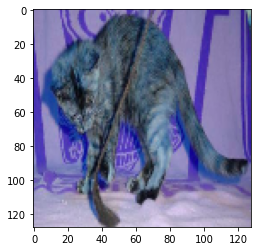

In [ ]:
names = ['Cat' , 'Dog']
for index in incorrects[:100]:
  print(names[test_vec[index]])
  plt.imshow(test_x[index])
  plt.show()
  print('\n\n\n')

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def load_data_from_directory(dir,width,height,classes):
  img_data = []
  img_label = []
  counter = 0
  categories = os.listdir(dir)
  for category in categories:
    for file in os.listdir(os.path.join(dir,category)):
      img_path = os.path.join(dir,category,file)
      img = cv2.imread(img_path)
      if counter%5 == 0:
        red_channel = (img[:,:,0]/1.5) + 80
        green_channel = (img[:,:,1]/1.5) + 30
        blue_channel = (img[:,:,2]/1.5)
        img2 = img
        img2[:,:,0] = red_channel
        img2[:,:,1] = green_channel
        img2[:,:,2] = blue_channel
        img2 = cv2.resize(img2,(width,height))
        img2 = np.array(img2).astype('float32') / 255
        img_data.append(img2)
        img_label.append(category)

      img = cv2.resize(img,(width,height))
      img = np.array(img).astype('float32') / 255
      
      img_data.append(img)
      img_label.append(category)
      counter = counter + 1

  img_onehot = np_utils.to_categorical([categories.index(label) for label in img_label],classes,dtype=np.ubyte)
  img_data = np.array(img_data)
  img_onehot = np.array(img_onehot)

  zip_list = list(zip(img_data, img_label, img_onehot))
  random.shuffle(zip_list)
  img_data, img_label, img_onehot = zip(*zip_list)
  return img_data , img_label, img_onehot

In [ ]:
train_x , train_label, train_onehot = load_data_from_directory(training_dir,w,h,classes)
test_x , test_label, test_onehot = load_data_from_directory(test_dir,w,h,classes)

In [ ]:
test_label2 = []
for i, label in enumerate(test_label):
     test_label2.append(1) if (label == 'dogs') else test_label2.append(0)

In [ ]:
train_x = np.asarray(train_x)
train_label = np.asarray(train_label)
train_onehot = np.asarray(train_onehot)

test_x = np.asarray(test_x)
test_label = np.asarray(test_label2)
test_onehot = np.asarray(test_onehot)

In [ ]:
!rm -rf cleanData
!mkdir cleanData
np.save('cleanData/train_x.npy',train_x)
np.save('cleanData/train_label.npy',train_label)
np.save('cleanData/train_onehot.npy',train_onehot)

np.save('cleanData/test_x.npy',test_x)
np.save('cleanData/test_label.npy',test_label)
np.save('cleanData/test_onehot.npy',test_onehot)

In [7]:
train_label = np.load('cleanData/train_onehot.npy')
train_x = np.load('cleanData/train_x.npy')

test_x = np.load('cleanData/test_x.npy')
test_label = np.load('cleanData/test_onehot.npy')
test_vec = np.load('cleanData/test_label.npy')

In [17]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def train_model(config):
  model = Sequential()

  model.add(Flatten(input_shape=(h,w,3)))
  model.add(Dropout(config['in_drop_out']))

  for act ,drop_out, layers in config['layers']:
    for layer in layers:
      model.add(Dense(layer))
      model.add(act())
      model.add(Dropout(drop_out))

  model.compile(
    optimizer=Adam(config['learning_rate']),
    loss=categorical_crossentropy,
    metrics=['accuracy']
  )

  train_datagen = ImageDataGenerator(
        rotation_range=config['aug_rotation'],
        width_shift_range=config['aug_shift_w'],
        height_shift_range=config['aug_shift_h'],
        shear_range=config['aug_shear'],
        zoom_range=config['aug_zoom'],
        horizontal_flip=config['aug_horizontal_flip'],
        fill_mode='nearest'
  )

  train_generator = train_datagen.flow(train_X, train_Label, batch_size = config['batch'])

  validation_datagen = ImageDataGenerator()
  validation_generator = validation_datagen.flow(valid_X,valid_Label,batch_size=256)

  history = model.fit(train_generator,
                      validation_data=validation_generator,
                      epochs = config['epochs'],
                      batch_size=config['batch'],
                      steps_per_epoch=math.ceil(8000/config['batch']),
                      validation_steps = math.ceil(2000/config['batch'])
                    )
  
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train','validation'],loc='lower right')
  plt.show()

  test_eval = model.evaluate(test_x, test_label, verbose = 0)
  print('Test loss: ', test_eval[0])
  print('Test accuracy: ', test_eval[1])
  print('\n\n')
  
  predictes_classes = model.predict(test_x)
  predicted_classes = np.argmax(np.round(predictes_classes), axis = 1)

  from sklearn.metrics import classification_report
  target_names = ["Class {}".format(i) for i in range(classes)]
  print(classification_report(test_vec, predicted_classes, target_names = target_names))

  return model

Epoch 1/100
32/32 [==============================] - 28s 791ms/step - loss: 0.6958 - accuracy: 0.5084 - val_loss: 0.6932 - val_accuracy: 0.5065
Epoch 2/100
32/32 [==============================] - 23s 747ms/step - loss: 0.6939 - accuracy: 0.4952 - val_loss: 0.6927 - val_accuracy: 0.5167
Epoch 3/100
32/32 [==============================] - 24s 750ms/step - loss: 0.6934 - accuracy: 0.4968 - val_loss: 0.6928 - val_accuracy: 0.5221
Epoch 4/100
32/32 [==============================] - 24s 748ms/step - loss: 0.6929 - accuracy: 0.5079 - val_loss: 0.6928 - val_accuracy: 0.4988
Epoch 5/100
32/32 [==============================] - 24s 748ms/step - loss: 0.6920 - accuracy: 0.5290 - val_loss: 0.6914 - val_accuracy: 0.5280
Epoch 6/100
32/32 [==============================] - 24s 746ms/step - loss: 0.6905 - accuracy: 0.5477 - val_loss: 0.6844 - val_accuracy: 0.5668
Epoch 7/100
32/32 [==============================] - 24s 750ms/step - loss: 0.6930 - accuracy: 0.5243 - val_loss: 0.6933 - val_accuracy:

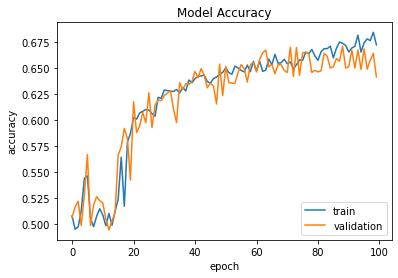

Test loss:  0.6175241470336914
Test accuracy:  0.6524999737739563



              precision    recall  f1-score   support

     Class 0       0.61      0.82      0.70      1000
     Class 1       0.73      0.48      0.58      1000

    accuracy                           0.65      2000
   macro avg       0.67      0.65      0.64      2000
weighted avg       0.67      0.65      0.64      2000



In [13]:
# %%script false
model = train_model({
    'in_drop_out':0,
    'layers' : [
          (lambda : Activation('relu'),0.02,[2000,1600,800,600,500]+[400]*3+[400]*5+[300,250,200,150,120]), 
          (lambda : Activation('softmax'),0,[2])
    ],
    'learning_rate':3e-4,
    'batch':256,
    'epochs':100,
    'aug_rotation':15,
    'aug_shift_w':0.06,
    'aug_shift_h':0.06,
    'aug_shear':0.06,
    'aug_zoom':0.06,
    'aug_horizontal_flip':True
})

In [18]:
from sklearn.model_selection import train_test_split
train_X, valid_X, train_Label, valid_Label = train_test_split(train_x, train_label, test_size = 0.2, random_state = 13)

In [19]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def train_model(config):
  model = Sequential()

  model.add(Flatten(input_shape=(h,w,3)))
  model.add(Dropout(config['in_drop_out']))

  for act ,drop_out, layers in config['layers']:
    for layer in layers:
      model.add(Dense(layer))
      model.add(act())
      model.add(Dropout(drop_out))

  model.compile(
    optimizer=Adam(config['learning_rate']),
    loss=categorical_crossentropy,
    metrics=['accuracy']
  )

  train_datagen = ImageDataGenerator(
        rotation_range=config['aug_rotation'],
        width_shift_range=config['aug_shift_w'],
        height_shift_range=config['aug_shift_h'],
        shear_range=config['aug_shear'],
        zoom_range=config['aug_zoom'],
        horizontal_flip=config['aug_horizontal_flip'],
        fill_mode='nearest'
  )

  train_generator = train_datagen.flow(train_X, train_Label, batch_size = config['batch'])

  validation_datagen = ImageDataGenerator()
  validation_generator = validation_datagen.flow(valid_X,valid_Label,batch_size=256)

  history = model.fit(train_generator,
                      validation_data=validation_generator,
                      epochs = config['epochs'],
                      batch_size=config['batch'],
                      steps_per_epoch=math.ceil(8000/config['batch']),
                      validation_steps = math.ceil(2000/config['batch'])
                    )
  
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train','validation'],loc='lower right')
  plt.show()

  test_eval = model.evaluate(test_x, test_label, verbose = 0)
  print('Test loss: ', test_eval[0])
  print('Test accuracy: ', test_eval[1])
  print('\n\n')
  
  predictes_classes = model.predict(test_x)
  predicted_classes = np.argmax(np.round(predictes_classes), axis = 1)

  from sklearn.metrics import classification_report
  target_names = ["Class {}".format(i) for i in range(classes)]
  print(classification_report(test_vec, predicted_classes, target_names = target_names))

  return model

Epoch 1/100
32/32 [==============================] - 28s 805ms/step - loss: 0.6942 - accuracy: 0.5148 - val_loss: 0.6933 - val_accuracy: 0.5102
Epoch 2/100
32/32 [==============================] - 24s 764ms/step - loss: 0.6936 - accuracy: 0.5013 - val_loss: 0.6931 - val_accuracy: 0.4946
Epoch 3/100
32/32 [==============================] - 24s 766ms/step - loss: 0.6931 - accuracy: 0.5076 - val_loss: 0.6930 - val_accuracy: 0.5151
Epoch 4/100
32/32 [==============================] - 24s 760ms/step - loss: 0.6929 - accuracy: 0.5256 - val_loss: 0.6922 - val_accuracy: 0.5054
Epoch 5/100
32/32 [==============================] - 24s 764ms/step - loss: 0.6932 - accuracy: 0.5061 - val_loss: 0.6930 - val_accuracy: 0.4995
Epoch 6/100
32/32 [==============================] - 24s 761ms/step - loss: 0.6933 - accuracy: 0.4909 - val_loss: 0.6910 - val_accuracy: 0.5603
Epoch 7/100
32/32 [==============================] - 24s 758ms/step - loss: 0.6921 - accuracy: 0.5350 - val_loss: 0.6888 - val_accuracy:

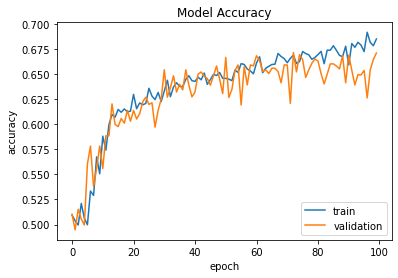

Test loss:  0.6059718728065491
Test accuracy:  0.6735000014305115



              precision    recall  f1-score   support

     Class 0       0.66      0.73      0.69      1000
     Class 1       0.69      0.62      0.66      1000

    accuracy                           0.67      2000
   macro avg       0.68      0.67      0.67      2000
weighted avg       0.68      0.67      0.67      2000



In [20]:
# %%script false
model = train_model({
    'in_drop_out':0,
    'layers' : [
          (lambda : Activation('relu'),0.02,[2000,1600,800,600,500]+[400]*3+[400]*5+[300,250,200,150,120]), 
          (lambda : Activation('softmax'),0,[2])
    ],
    'learning_rate':3e-4,
    'batch':256,
    'epochs':100,
    'aug_rotation':15,
    'aug_shift_w':0.06,
    'aug_shift_h':0.06,
    'aug_shear':0.06,
    'aug_zoom':0.06,
    'aug_horizontal_flip':True
})